In [1]:
import sys, os
sys.path.insert(0, os.path.abspath('..'))
from scripts import project_functions
import pandas_profiling
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

# Introduction
This dataset contains records taken from ESPN's database and the Engsoccerdata GitHub repository, about club soccer teams and matches played amongst one another. There are a number of columns of interest in this dataset including the predicted score of the match, the probability of one team winning, how important the match is to each team, the actual score of the match, and many more. There are over 10000 records in this dataset with matches that have taken place in 2019 and 2020. Note that any match still to play in 2020 will just have the predicted score, and the probability filled in for their records. My question as a whole on this dataset lies around how good each factor (column) is at predicting the results of the match. There are many sub categories of this that I will address in smaller questions, but putting it all together to see how well each does in predicting the outcome is the main question that I have. 

# Dataset
<p>As mentioned before the dataset as a whole contains over 10000 records. Each column in the dataset is described as follows:</p> 

| Column | Description |
| --- | --- |
| season | The year in which the match took place (2019 or 2020) | 
| date | The corresponding year, day, and month the match took place | 
| league | The league name that the match took place in |
| team1/2 | Team name of both teams involved in the match | 
| spi1/2 | The SPI ranking of each team, which is an estimate of a team's overall strength | 
| prob1/2 | The probability of either team winning the match |
| probtie | The probability of the match ending in a tie | 
| proj_score1/2 | The projected scores for each team involved in the match | 
| importance1/2 | How important the game is too each team, dependent on a number of factors|
| score1/2 | The actual score of both teams involved in the match | 
| xg1/2 | An estimate of how many goals a team should have scored given the number of shots they took | 
| nsxg1/2 | An estimate of how many goals a team should have scored based on actions they took around the opposing goal |

## Method Chaining and Wranging/Cleaning Data
A lot of the records in the dataset had NAN values due to matches not being played. As a result, since our questions lies around analyzing how good the predictions are at predicting the outcome of the game these records were removed. 

In [2]:
df = project_functions.load_and_process("https://projects.fivethirtyeight.com/soccer-api/club/spi_matches_latest.csv")
df.head()

,season,date,league,team1,team2,spi1,spi2,prob1,prob2,probtie,proj_score1,proj_score2,importance1,importance2,score1,score2,xg1,xg2,nsxg1,nsxg2
0,2019,2019-03-01,Chinese Super League,Shandong Luneng,Guizhou Renhe,48.22,37.83,0.5755,0.1740,0.2505,1.75,0.84,45.9,22.1,1.0,0.0,1.39,0.26,2.05,0.54
1,2019,2019-03-01,Chinese Super League,Guangzhou Evergrande,Tianjin Quanujian,65.59,39.99,0.7832,0.0673,0.1495,2.58,0.62,77.1,28.8,3.0,0.0,0.49,0.45,1.05,0.75
2,2019,2019-03-01,Chinese Super League,Shanghai Greenland,Shanghai SIPG,39.81,60.08,0.2387,0.5203,0.2410,1.22,1.89,25.6,63.4,0.0,4.0,0.57,2.76,0.80,1.50
3,2019,2019-03-01,Chinese Super League,Wuhan Zall,Beijing Guoan,32.25,54.82,0.2276,0.5226,0.2498,1.10,1.79,35.8,58.9,0.0,1.0,1.12,0.97,1.51,0.94
4,2019,2019-03-01,Chinese Super League,Chongqing Lifan,Guangzhou RF,38.24,40.45,0.4403,0.2932,0.2665,1.57,1.24,26.2,21.3,2.0,2.0,2.77,3.17,1.05,2.08


After removal of these records there were 2385 left. 

# Exploratory Data Analysis

## Deeper Analysis into the Variables

In [3]:
df.describe(include=project_functions.np.number)

,season,spi1,spi2,prob1,prob2,probtie,proj_score1,proj_score2,importance1,importance2,score1,score2,xg1,xg2,nsxg1,nsxg2
count,2646.000000,2646.000000,2646.000000,2646.000000,2646.000000,2646.000000,2646.000000,2646.000000,2646.000000,2646.000000,2646.000000,2646.000000,2646.000000,2646.000000,2646.000000,2646.000000
mean,2019.726002,49.204025,49.012766,0.443390,0.309166,0.247443,1.508980,1.196859,33.982691,33.100831,1.500378,1.265306,1.479940,1.226194,1.365907,1.161920
std,0.446093,15.701860,15.877677,0.150195,0.136356,0.048584,0.389599,0.383256,24.807402,24.580582,1.255837,1.165956,0.834652,0.774539,0.629654,0.599184
min,2019.000000,15.460000,15.030000,0.051700,0.011300,0.000000,0.430000,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010000
25%,2019.000000,38.440000,38.210000,0.346850,0.225100,0.232500,1.250000,0.960000,17.825000,17.100000,1.000000,0.000000,0.850000,0.652500,0.910000,0.750000
50%,2020.000000,45.825000,45.465000,0.435200,0.293150,0.257800,1.450000,1.150000,28.800000,27.500000,1.000000,1.000000,1.360000,1.080000,1.280000,1.050000
75%,2020.000000,59.327500,59.105000,0.524325,0.385100,0.276300,1.710000,1.400000,44.400000,43.900000,2.000000,2.000000,1.980000,1.640000,1.710000,1.480000
max,2020.000000,94.660000,95.320000,0.924100,0.828000,0.325800,3.460000,3.110000,100.000000,100.000000,8.000000,13.000000,6.190000,8.270000,4.340000,7.170000


### Observations:
- Taking a look at the first table, there aren't any big outliers that jump out as being 'incorrect' data 
- A couple of columns do have some interesting data in them such as:
    - The max probability of one team winning (prob1 = 0.924, prob2 = 0.828) is much higher than the max probabilty of their being a tie (probtie = 0.325) 
    - The max importance for either team is set at 100 meaning there are some games which are a must win for teams, and the min importance is at 0 meaning some games do not matter at all for some teams
    - The max score recorded is 13 which is a very rare occurence in a soccer match
    - The difference between the mean for proj_score1 and score1 is 0.003397 , and the difference for proj_score2 and score 2 is 0.067412, meaning that as a whole the predictive model looks as though it is doing a good job of predicting the score


In [4]:
df.describe(include=project_functions.np.object)

,date,league,team1,team2
count,2646,2646,2646,2646
unique,325,19,353,353
top,2020-10-03,Major League Soccer,Guadalajara,León
freq,62,317,17,16


### Observations:
- Not much of note here other than that the top league with the most rows is Major League Soccer, expected it to be the Premier League from my knowledge

In [5]:
df.profile_report()

### Observations
- Good to see that there are no missing cells and we still have over 2249 rows of observations with 20 columns
- No duplicate rows meaning we have lots of unique data
- Interesting to see there are 1524 2020 season variables compared to 725 2019 season variables
- A lot of the variables have a high cardinality meaning there columns with values are very unique
- Both proj_score1 and proj_score2 are highly correlated with prob1 and prob2 respectively, which makes sense because the higher than projected score for a team the greater chance they have to win, and lower score = lower chance


## Relationships Between Variables
As there are many variables in this dataset, the first things we need to do is observe any type of relationship that exists between different variables in the dataset.

### Correlation Matrix
A correlation matrix can get us heading in the right direction. A correlation matrix shows correlation coefficients between variables. Each cell in the table shows the correlation between two variables. Any positive value in a cell indicates two positively correlated variables and vice versa with a negative value. The values in the cells can only be between -1 and 1, and the further away the correlation coefficient is from zero, the stronger the relationship between the two variables. A quick example is a correlation between 'hours studied' and 'exam score', which has a correlation coefficient of 0.82 meaning more hour spent studying is greatly related to higher exam scores. Thus, we can use the following correlation matrix to observe relationships between variables and draw conclusions from them. 

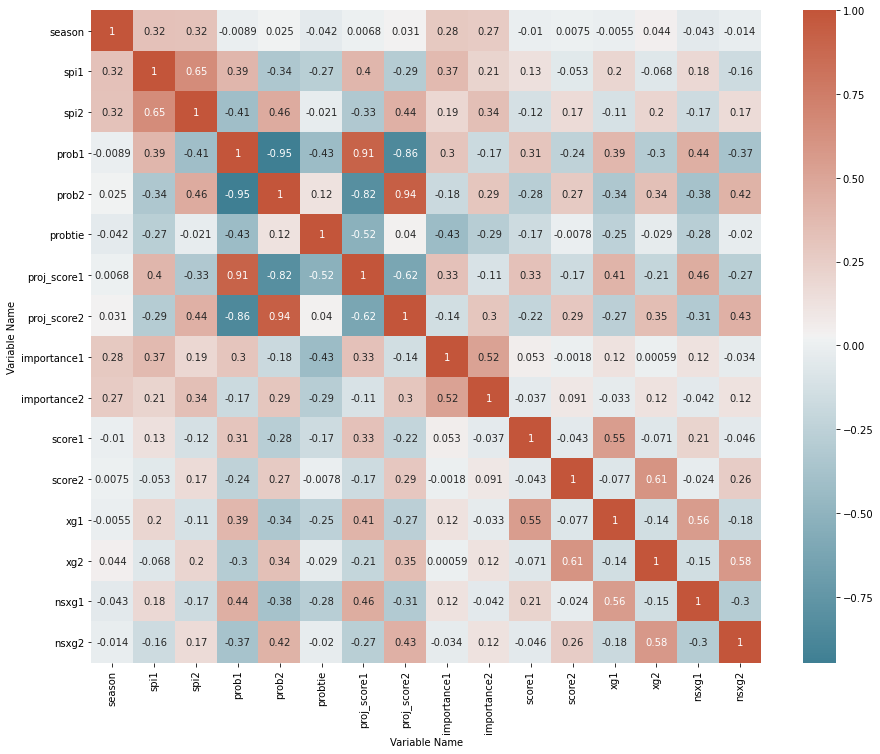

In [6]:
#HeatMap taken from the guide at https://towardsdatascience.com/an-extensive-guide-to-exploratory-data-analysis-ddd99a03199e
corr = df.corr()# plot the heatmap
plt.subplots(figsize=(15,12))
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, annot=True, cmap=sns.diverging_palette(220, 20, as_cmap=True))
plt.xlabel("Variable Name")
plt.ylabel("Variable Name")
plt.show()

#### Observations on Correlation Matrix
- spi1/2 
    - has positive correlation with their respective prob1/2 and a negative correlation with the opposite prob1/2. This makes sense as the higher the spi ranking for a team the higher the probability for that team should be and the lower the spi ranking for a team the higher the opposing teams probability should be.
    - has a positive correlation with their respective proj_score1/2 and a negative correlation with the opposite proj_score/2. Again, this makes sense as the higher/lowr the spi ranking for a team the higher/lower projected scores should be for that team and the opposing team. (note this exists for score1/2 as well)
    - has a positive correlation with their respective xg1/2, nsxg1/2 (shot-based expected goals and non-shot expected goals) and a negative correlation with the opposite xg1/2,nsxg1/2. This is interesting to see because it is basically telling us the higher the spi ranking for a team the more goals they should score based on shots and non-shooting actions around the goal, and vice versa with less shots and less actions should amount to less goals for them
- prob1/2 
    - as discussed before, has a positive/negative correlation with proj_score1/2 respectively as well as score1/2
- probtie
    - has a negative correlation with basically every column. Makes sense because the probability of a tie occuring means that both teams play the same thus one team has no advantage over the other
- importance1/2
    - has a positive correlation with their respective prob1/2 and negative correlation with the opposite prob1/2. Basically saying that the more important that the game is to a team the higher the probabilty they have and less important the game the lower probability they have. This is the same correlation for score1/2 as well. Also, interesting to note it has a negative correlation with probtie, meaning that if a game is important to a team the less likely they will play for the tie
    - has a positive correlation with each other. Meaning that the more important a game is to one team, it is likely that the game is important for the other team as well. 
- score1/2
    - has a positive correlation with their respective xg1/2, nsxg1/2. This makes sense as the higher the score1/2 is for a team the more shots they should of taken around the opposing teams goal (xg1/2) respectively, and the greater number of non-shooting actions they should have taken around the opposing teams goal (nsxg1/2)


### PairPlot
We can construct pair plots to observe the relationships that we had observed initally in the correlation matrix to take a further look into the variables and observe them. I chose this so I can ensure that there is an existing relationship between the variables and find ways to answer questions based on them. 

First, construct the pairplot to observe the relationships between spi1/2 and the variables. 

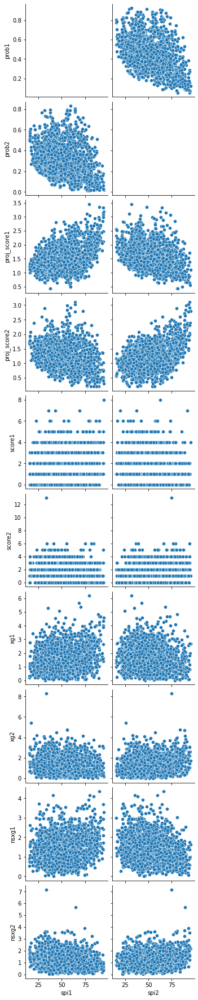

In [7]:
# sns.pairplot(df, x_vars=['spi1','spi2','prob1','prob2','probtie','proj_score1','proj_score2','importance1','importance2','score1','score2','xg1','xg2','nsxg1','nsxg2'],y_vars=['spi1','spi2','prob1','prob2','probtie','proj_score1','proj_score2','importance1','importance2','score1','score2','xg1','xg2','nsxg1','nsxg2'],corner=True)
sns.pairplot(df, x_vars=['spi1','spi2'],y_vars=['prob1','prob2','proj_score1','proj_score2','score1','score2','xg1','xg2','nsxg1','nsxg2'])
plt.ylabel("Variable Name")
plt.xlabel("Variable Name")
plt.show()

#### Observations on PairPlot (spi1/2)
- The relationship between spi1/2 and proj_score1/2 is interesting to see. As spi1/2 increases so does the proj_score1/2 for that team and as the opposite teams spi1/2 increases the proj_score1/2 decreases. 

Second, we can observe the relationships between importance1/2 and the correlated variables. 

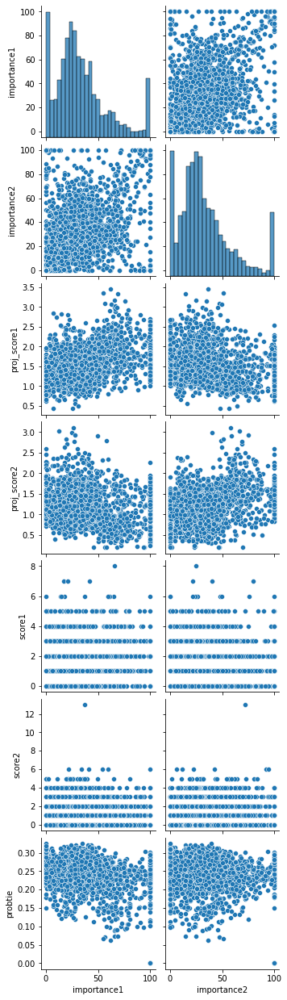

In [8]:
sns.pairplot(df, x_vars=['importance1','importance2'],y_vars=['importance1','importance2','proj_score1','proj_score2','score1','score2','probtie'])
plt.xlabel("randomm")
plt.show()

#### Observations on PairPlot (importance1/2)
- Although most of these pair plots show a positive correlation between the variables, it is very interesting to take a look at the importance1 and importance2 pair plot and vice versa. As mentioned before there are occasions where both teams have a 100% importance for both teams.

### Hexbin Plot

Further, creating a Hexbin Plot to observe the values between importance1 and importance2 as they are correlated and to see where most of the points lie around.

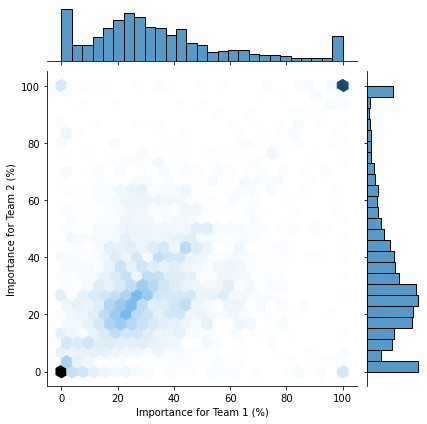

In [9]:
hexb =sns.jointplot(x=df['importance1'],y=df['importance2'],kind="hex")
hexb.set_axis_labels('x', 'y', fontsize=10)
hexb.ax_joint.set_xlabel('Importance for Team 1 (%)')
hexb.ax_joint.set_ylabel('Importance for Team 2 (%)')
plt.show()

#### Observations on Hexbin Plot
- This is very interesting to see. Most of the importance values lie at 0 meaning a lot of the games in this dataset do not matter for both teams. This however does make sense, as a lot of the time the standings are finalized late in the season and thus the teams do not care if they win or lose. There are however a good amount of values at 100 meaning there are a lot of games that are do or die for teams. The rest are spread around 20-40 mostly. 

### Boxplot and Strip Plot

Creating a Boxplot and Strip Plot to see score totals (sum of score 1 and score 2) in each league - this will be used later to compute the average score of each league. Note that the solid points on the boxplot indicate the total score for a game. Multiple matches in a league can have the same score.

In [10]:
dfScore = project_functions.totalScore(df)
dfScore.head()

,season,date,league,team1,team2,spi1,spi2,prob1,prob2,probtie,...,proj_score2,importance1,importance2,score1,score2,xg1,xg2,nsxg1,nsxg2,TotalScore
0,2019,2019-03-01,Chinese Super League,Shandong Luneng,Guizhou Renhe,48.22,37.83,0.5755,0.1740,0.2505,...,0.84,45.9,22.1,1.0,0.0,1.39,0.26,2.05,0.54,1.0
1,2019,2019-03-01,Chinese Super League,Guangzhou Evergrande,Tianjin Quanujian,65.59,39.99,0.7832,0.0673,0.1495,...,0.62,77.1,28.8,3.0,0.0,0.49,0.45,1.05,0.75,3.0
2,2019,2019-03-01,Chinese Super League,Shanghai Greenland,Shanghai SIPG,39.81,60.08,0.2387,0.5203,0.2410,...,1.89,25.6,63.4,0.0,4.0,0.57,2.76,0.80,1.50,4.0
3,2019,2019-03-01,Chinese Super League,Wuhan Zall,Beijing Guoan,32.25,54.82,0.2276,0.5226,0.2498,...,1.79,35.8,58.9,0.0,1.0,1.12,0.97,1.51,0.94,1.0
4,2019,2019-03-01,Chinese Super League,Chongqing Lifan,Guangzhou RF,38.24,40.45,0.4403,0.2932,0.2665,...,1.24,26.2,21.3,2.0,2.0,2.77,3.17,1.05,2.08,4.0


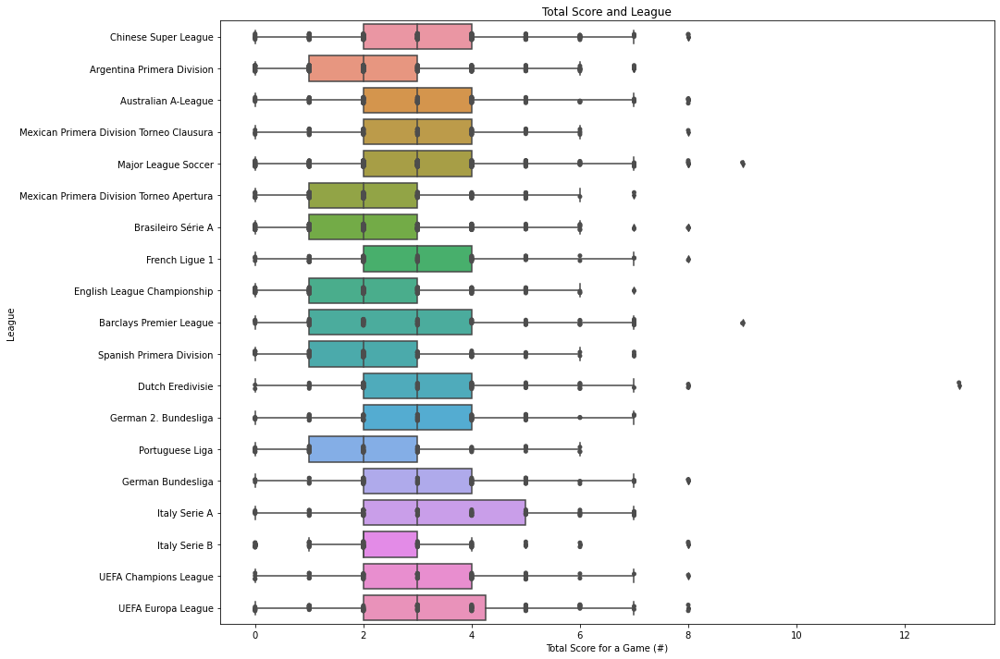

In [11]:
plt.subplots(figsize=(15,12))
boxp = sns.boxplot(y=dfScore['league'],x=dfScore['TotalScore'])
stripp = sns.stripplot(y=dfScore['league'],x=dfScore['TotalScore'],color='.3')
plt.xlabel('Total Score for a Game (#)')
plt.ylabel('League')
plt.title('Total Score and League')
plt.show()

#### Observations on Boxplot and Strip Plot
- Without looking into the average Total Score for a league we cannot officially say which league is the most scoring league, but for now looking at the histogram:
    - One big outlier is in the Dutch Eredivisie with a score of 13 goals for one game
    - Most of the data is concentrated around 1-4 total goals
    - Very little amounts of high total scores
    

# Conduct Analysis on Research Questions

### Research Questions
1. Which of the two columns, probabilities and importance, are better at predicting the actual outcome of the game?
2. How accurate are the projected score parameters, as well as xg and nsxg at predicting the actual score?

### Plan of Attack for Research Questions
1. Create a new column "predictedWinner" with the projected winner based on the parameters
2. Do the same thing but create a column "actualWinner" with the actual winner determined by the scores given
3. Use some data visualizations to determine how well each parameter does in predicting
4. Do basically the same thing for the scores and compare the predictions to the actual scores

### Research Question 1: Which of the two columns, probabilities and importance, are better at predicting the actual outcome of the game?

#### Creating Column for predicted winner based on each probabilities:
<p> Note: we put team 1 if team 1 is projected to win, and team 2 if team 2 is projected to win. As ties do not have a high probability projected, we will say any time the probability for a tie is greater than 0.3 we will classify that as a predicted tie game. <p>

In [12]:
df['probPredWinner'] = df.apply(project_functions.prediction, axis=1)

In [13]:
df

,season,date,league,team1,team2,spi1,spi2,prob1,prob2,probtie,...,proj_score2,importance1,importance2,score1,score2,xg1,xg2,nsxg1,nsxg2,probPredWinner
0,2019,2019-03-01,Chinese Super League,Shandong Luneng,Guizhou Renhe,48.22,37.83,0.5755,0.1740,0.2505,...,0.84,45.9,22.1,1.0,0.0,1.39,0.26,2.05,0.54,team1
1,2019,2019-03-01,Chinese Super League,Guangzhou Evergrande,Tianjin Quanujian,65.59,39.99,0.7832,0.0673,0.1495,...,0.62,77.1,28.8,3.0,0.0,0.49,0.45,1.05,0.75,team1
2,2019,2019-03-01,Chinese Super League,Shanghai Greenland,Shanghai SIPG,39.81,60.08,0.2387,0.5203,0.2410,...,1.89,25.6,63.4,0.0,4.0,0.57,2.76,0.80,1.50,team2
3,2019,2019-03-01,Chinese Super League,Wuhan Zall,Beijing Guoan,32.25,54.82,0.2276,0.5226,0.2498,...,1.79,35.8,58.9,0.0,1.0,1.12,0.97,1.51,0.94,team2
4,2019,2019-03-01,Chinese Super League,Chongqing Lifan,Guangzhou RF,38.24,40.45,0.4403,0.2932,0.2665,...,1.24,26.2,21.3,2.0,2.0,2.77,3.17,1.05,2.08,team1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2641,2020,2020-12-05,Dutch Eredivisie,RKC,VVV Venlo,29.08,31.38,0.4246,0.3029,0.2725,...,1.26,48.3,50.7,3.0,2.0,2.54,1.29,2.25,0.60,team1
2642,2020,2020-12-05,Portuguese Liga,Guimaraes,Portimonense,51.98,44.75,0.5066,0.2166,0.2768,...,0.80,13.7,29.0,1.0,0.0,0.45,0.33,1.15,0.81,team1
2643,2020,2020-12-05,Portuguese Liga,Moreirense,Gil Vicente,41.26,44.78,0.4228,0.2895,0.2877,...,0.97,39.3,28.3,1.0,1.0,0.08,0.78,0.00,0.37,team1
2644,2020,2020-12-05,French Ligue 1,Stade Rennes,Lens,66.94,58.72,0.5233,0.2212,0.2555,...,0.98,28.1,13.7,0.0,2.0,0.42,0.92,0.76,0.55,team1


#### Creating Column for actual winner of the game
<p> Comparing the scores of the game, tie will be classified if both scores are the same

In [14]:
df['actualWinner'] = df.apply(project_functions.actual, axis=1)

In [15]:
df

,season,date,league,team1,team2,spi1,spi2,prob1,prob2,probtie,...,importance1,importance2,score1,score2,xg1,xg2,nsxg1,nsxg2,probPredWinner,actualWinner
0,2019,2019-03-01,Chinese Super League,Shandong Luneng,Guizhou Renhe,48.22,37.83,0.5755,0.1740,0.2505,...,45.9,22.1,1.0,0.0,1.39,0.26,2.05,0.54,team1,team1
1,2019,2019-03-01,Chinese Super League,Guangzhou Evergrande,Tianjin Quanujian,65.59,39.99,0.7832,0.0673,0.1495,...,77.1,28.8,3.0,0.0,0.49,0.45,1.05,0.75,team1,team1
2,2019,2019-03-01,Chinese Super League,Shanghai Greenland,Shanghai SIPG,39.81,60.08,0.2387,0.5203,0.2410,...,25.6,63.4,0.0,4.0,0.57,2.76,0.80,1.50,team2,team2
3,2019,2019-03-01,Chinese Super League,Wuhan Zall,Beijing Guoan,32.25,54.82,0.2276,0.5226,0.2498,...,35.8,58.9,0.0,1.0,1.12,0.97,1.51,0.94,team2,team2
4,2019,2019-03-01,Chinese Super League,Chongqing Lifan,Guangzhou RF,38.24,40.45,0.4403,0.2932,0.2665,...,26.2,21.3,2.0,2.0,2.77,3.17,1.05,2.08,team1,tie
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2641,2020,2020-12-05,Dutch Eredivisie,RKC,VVV Venlo,29.08,31.38,0.4246,0.3029,0.2725,...,48.3,50.7,3.0,2.0,2.54,1.29,2.25,0.60,team1,team1
2642,2020,2020-12-05,Portuguese Liga,Guimaraes,Portimonense,51.98,44.75,0.5066,0.2166,0.2768,...,13.7,29.0,1.0,0.0,0.45,0.33,1.15,0.81,team1,team1
2643,2020,2020-12-05,Portuguese Liga,Moreirense,Gil Vicente,41.26,44.78,0.4228,0.2895,0.2877,...,39.3,28.3,1.0,1.0,0.08,0.78,0.00,0.37,team1,tie
2644,2020,2020-12-05,French Ligue 1,Stade Rennes,Lens,66.94,58.72,0.5233,0.2212,0.2555,...,28.1,13.7,0.0,2.0,0.42,0.92,0.76,0.55,team1,team2


#### Creating Column for predicted winner based on importance:
<p> Comparing the importance value and if one team has a higher importance than the other they will be projected to win. If the same then a tie. <p>

In [16]:
df['predImpWinner'] = df.apply(project_functions.impPrediction, axis=1)

In [17]:
df

,season,date,league,team1,team2,spi1,spi2,prob1,prob2,probtie,...,importance2,score1,score2,xg1,xg2,nsxg1,nsxg2,probPredWinner,actualWinner,predImpWinner
0,2019,2019-03-01,Chinese Super League,Shandong Luneng,Guizhou Renhe,48.22,37.83,0.5755,0.1740,0.2505,...,22.1,1.0,0.0,1.39,0.26,2.05,0.54,team1,team1,team1
1,2019,2019-03-01,Chinese Super League,Guangzhou Evergrande,Tianjin Quanujian,65.59,39.99,0.7832,0.0673,0.1495,...,28.8,3.0,0.0,0.49,0.45,1.05,0.75,team1,team1,team1
2,2019,2019-03-01,Chinese Super League,Shanghai Greenland,Shanghai SIPG,39.81,60.08,0.2387,0.5203,0.2410,...,63.4,0.0,4.0,0.57,2.76,0.80,1.50,team2,team2,team2
3,2019,2019-03-01,Chinese Super League,Wuhan Zall,Beijing Guoan,32.25,54.82,0.2276,0.5226,0.2498,...,58.9,0.0,1.0,1.12,0.97,1.51,0.94,team2,team2,team2
4,2019,2019-03-01,Chinese Super League,Chongqing Lifan,Guangzhou RF,38.24,40.45,0.4403,0.2932,0.2665,...,21.3,2.0,2.0,2.77,3.17,1.05,2.08,team1,tie,team1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2641,2020,2020-12-05,Dutch Eredivisie,RKC,VVV Venlo,29.08,31.38,0.4246,0.3029,0.2725,...,50.7,3.0,2.0,2.54,1.29,2.25,0.60,team1,team1,team2
2642,2020,2020-12-05,Portuguese Liga,Guimaraes,Portimonense,51.98,44.75,0.5066,0.2166,0.2768,...,29.0,1.0,0.0,0.45,0.33,1.15,0.81,team1,team1,team2
2643,2020,2020-12-05,Portuguese Liga,Moreirense,Gil Vicente,41.26,44.78,0.4228,0.2895,0.2877,...,28.3,1.0,1.0,0.08,0.78,0.00,0.37,team1,tie,team1
2644,2020,2020-12-05,French Ligue 1,Stade Rennes,Lens,66.94,58.72,0.5233,0.2212,0.2555,...,13.7,0.0,2.0,0.42,0.92,0.76,0.55,team1,team2,team1


<p> Now that we have the dataframe with the predictions based on the probabilities as well as the importance columns, we can use some visualizations to take a look at how accurate they are <p>

### Analysis
As the first question lies around determining which of the factors (probability or importance) are better at predicting the outcome of the game, the first step is to construct scatter plots between each variable and the actual score of the game. This will help to see the existing relationship between the variables in a better view. Next, we can construct countplots to give us a better view at how many times a win is projected for each team as well as a tie. After that we can construct the countplot for the actual results of the game and how many times each team win as well as how many times there was a tie to get a better view at which parameter could be better. Finally, we can create another count plot which shows us how many times the parameter predicted the correct result of the match. This countplot will give us a better visualization into how good each factor (probability and importance) performs.

#### Data Visualizations

Constructing a scatterplot to first observe the relationship between the variables. If there is a positive correlation between the variables we can say as one increases so does the other. 

**Prob1 vs Score 1 and Prob2 vs Score2**

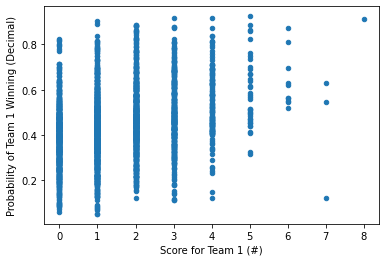

In [18]:
plot1 = df.plot(kind='scatter', x='score1', y='prob1')
plot1.set_xlabel('Score for Team 1 (#)')
plot1.set_ylabel('Probability of Team 1 Winning (Decimal)')
plt.show()

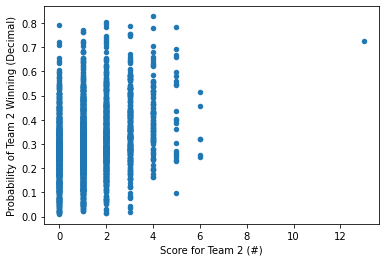

In [19]:
plot2 = df.plot(kind='scatter', x='score2', y='prob2')
plot2.set_xlabel('Score for Team 2 (#)')
plot2.set_ylabel('Probability of Team 2 Winning (Decimal)')
plt.show()

As expected, as the probability for a team increases so does their goals scored for the game.

**Importance1 vs Score 1 and Importance2 vs Score2**

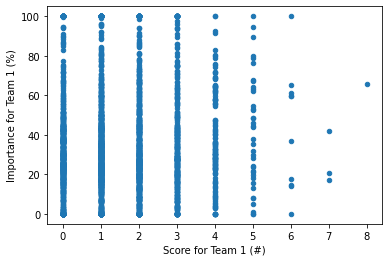

In [20]:
plot3 = df.plot(kind='scatter', x='score1', y='importance1')
plot3.set_xlabel('Score for Team 1 (#)')
plot3.set_ylabel('Importance for Team 1 (%)')
plt.show()

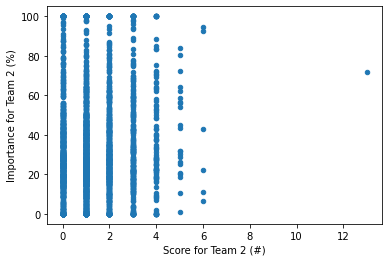

In [21]:
plot4 = df.plot(kind='scatter', x='score2', y='importance2')
plot4.set_xlabel('Score for Team 2 (#)')
plot4.set_ylabel('Importance for Team 2 (%)')
plt.show()

These two plots convey the same as the probability plots in the sense that importance1 and importance2, have a direct correlation with score1 and score2. 

Constructing a countplot to visualize the predictions for both prediction parameters. This will help determine how well each prediction parameter does in comparison to the actual result countplot. If a visualization looks close to the actual result visualization that is a good sign. 

Text(0, 0.5, 'Probability Prediction')

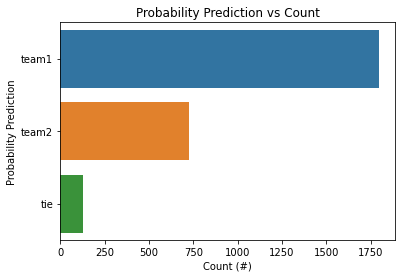

In [22]:
table = sns.countplot(y="probPredWinner", data=df)
table.set_title("Probability Prediction vs Count")
table.set_xlabel("Count (#)")
table.set_ylabel("Probability Prediction")

Text(0, 0.5, 'Importance Prediction')

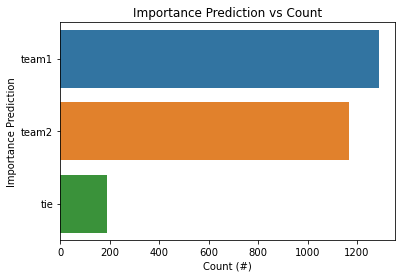

In [23]:
table1 = sns.countplot(y="predImpWinner", data=df)
table1.set_title("Importance Prediction vs Count")
table1.set_xlabel("Count (#)")
table1.set_ylabel("Importance Prediction")

Very interesting to see that team1 has a much higher predicted count of winning the match when taking into considerations the probalities as compared to when taking into account the importance. Vice versa for team 2 where the predicted is much higher for the importance parameter. 

Now comparing to the actual winners:

Text(0, 0.5, 'Actual Winner')

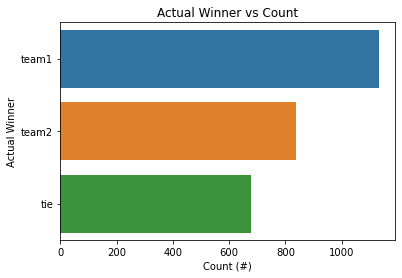

In [24]:
table2 = sns.countplot(y="actualWinner", data=df)
table2.set_title("Actual Winner vs Count")
table2.set_xlabel("Count (#)")
table2.set_ylabel("Actual Winner")

As can be seen there is a big jump in the amount of ties as compared to what was predicted. This could be due to the tie parameter we had set when constructing the data, but rarely in any sport is a tie ever predicted as it is hard to do so. This could be something to look to in the future. 

Now create a new column for each prediction parameter and if the prediction was correct we will assign it values accordingly (0 - prediction imcorrect, 1 - prediction correct). This will give us numeric values which we can then put into a table to gauge how well the parameters do in predicting the actual result. 

In [25]:
df['probPred'] = df.apply(project_functions.correctPred, axis=1)

In [26]:
df['impPred'] = df.apply(project_functions.correctImp, axis=1)

In [27]:
df.head()

,season,date,league,team1,team2,spi1,spi2,prob1,prob2,probtie,...,score2,xg1,xg2,nsxg1,nsxg2,probPredWinner,actualWinner,predImpWinner,probPred,impPred
0,2019,2019-03-01,Chinese Super League,Shandong Luneng,Guizhou Renhe,48.22,37.83,0.5755,0.1740,0.2505,...,0.0,1.39,0.26,2.05,0.54,team1,team1,team1,1,1
1,2019,2019-03-01,Chinese Super League,Guangzhou Evergrande,Tianjin Quanujian,65.59,39.99,0.7832,0.0673,0.1495,...,0.0,0.49,0.45,1.05,0.75,team1,team1,team1,1,1
2,2019,2019-03-01,Chinese Super League,Shanghai Greenland,Shanghai SIPG,39.81,60.08,0.2387,0.5203,0.2410,...,4.0,0.57,2.76,0.80,1.50,team2,team2,team2,1,1
3,2019,2019-03-01,Chinese Super League,Wuhan Zall,Beijing Guoan,32.25,54.82,0.2276,0.5226,0.2498,...,1.0,1.12,0.97,1.51,0.94,team2,team2,team2,1,1
4,2019,2019-03-01,Chinese Super League,Chongqing Lifan,Guangzhou RF,38.24,40.45,0.4403,0.2932,0.2665,...,2.0,2.77,3.17,1.05,2.08,team1,tie,team1,0,0


**Now create a countplot for each parameter**

Text(0, 0.5, 'Probability Result')

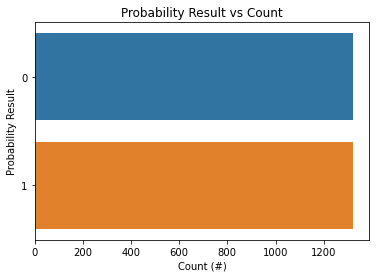

In [28]:
table3 = sns.countplot(y="probPred", data=df)
table3.set_title("Probability Result vs Count")
table3.set_xlabel("Count (#)")
table3.set_ylabel("Probability Result")

Text(0, 0.5, 'Importance Result')

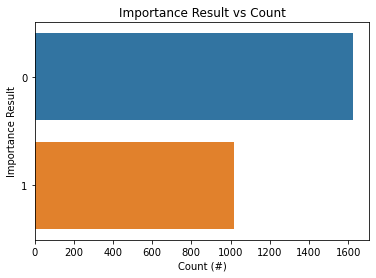

In [29]:
table4 = sns.countplot(y="impPred", data=df)
table4.set_title("Importance Result vs Count")
table4.set_xlabel("Count (#)")
table4.set_ylabel("Importance Result")

Interesting to see that the probability parameter has a much higher rate of succession just looking at the countplots, but neither seem to be very good from the plots.

**Tables to illustrate Data**

<p> Table 1 - shows us the percentage of each result predicted by the parameter<p> 

| | Probability | Importance | Actual |
| --- | --- | --- | --- |
| Ties | 4.1%        | 6.3%       | 25.3%  |
| Team 1 | 68.8%       | 48.9%      | 43.5% |
| Team 2 | 27.1%       | 44.7%      | 31.1% |

<p> Table 2 - to show the number of times the correct result of the game was predicted <p>

| | # of Correct | # of Incorrect | % Correct |
| --- | --- | --- | --- |
| Probability | 1136        | 1121       | 50.3%  |
| Importance | 871       | 1386      | 38.6% |


#### Summary and Conclusion

- First, by observing the scatterplots of both the probabilities vs actual scores and importance vs actual scores, we can see a direct correlation between the two. As the probability/importance start to increase so does the score for that team. Secondly, we can tale a look at the count plots for what the probability and importance parameter predicted vs the actual result count plot. Directly, we notice that the ties have a drastic difference between the predicted countplots and the actual countplots, which make sense as predicting a tie is the hardest thing to do in sports. In addition, the team1/team2 prediction for the probabilites differed greatly from the team1/team2 prediction for the importance. Taking a look at Table 1 we can directly see these results. Lastly, we compare the results of the predictions. We can see from the countplots that probability does a much better job at predicting the correct result in comparison to the importance parameter. Table 2 shows this results in detail as the probability paramater as has 50.3% correct rate and the importance parameter has a 38.6% correct rate. In conclusion, to answer our research question, the probability parameter does a much better job at predicting the correct result in comparison to the importance parameter; however, it is worth noting that neither is a very good indicator of the actual result as in our case the probability parameter was only correct 50% of the time. In future work it would be interesting to see the results of the probability plots if the tie parameter was moved around and trying to figure out at which value does this work best in the predictions. 

### Research Question 2: How accurate are the projected score parameters, as well as xg and nsxg at predicting the actual score?

<p> Note: A prediction is classified as correct if it is +- 0.5 from the actual score. For example, if the prediction for team 1 was 1.5 and team 1 scored 1, the prediction would be correct.

### Analysis
The second question looks into how accurate the projected score parameters (proj_score1/2, xg1/2, and nsxg1/2) are at predicting the actual score. As a result, the first step is to construct hexbins between each projected score parameter and the actual score. This method of visualization will help to observe where most of the values lie around and determining whether there are overlapping values. Next, we can construct countplots which indicate whether a prediction correctly predicted the correct score under a +- 0.5 threshold. This will help to determine whether or not the prediction parameter did well in predicting the score of the game. Finally, using these values we show off a table which will summarize the data as a whole. 

#### Constructing hexbin for each of the parameters:
The hexbin is a good visualization for this scenario as it will show us where most of the values lie around for each parameter and if a prediction parameter is doing good at predicting the actual score there will be many overlapping values. 

**proj_score1 vs score1, proj_score2 vs score2, xg1 vs score1, xg2 vs score2, nsxg1 vs score1, nsxg2 vs score1**

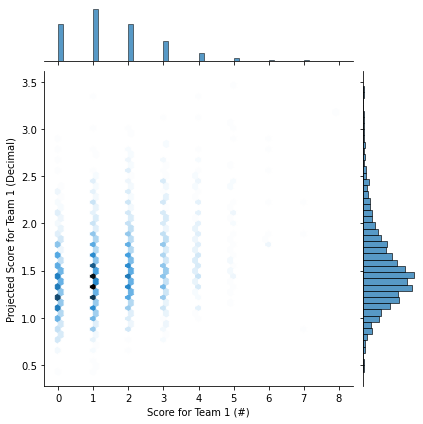

In [30]:
hexb =sns.jointplot(x=df['score1'],y=df['proj_score1'],kind="hex")
hexb.set_axis_labels('x', 'y', fontsize=10)
hexb.ax_joint.set_xlabel('Score for Team 1 (#)')
hexb.ax_joint.set_ylabel('Projected Score for Team 1 (Decimal)')
plt.show()

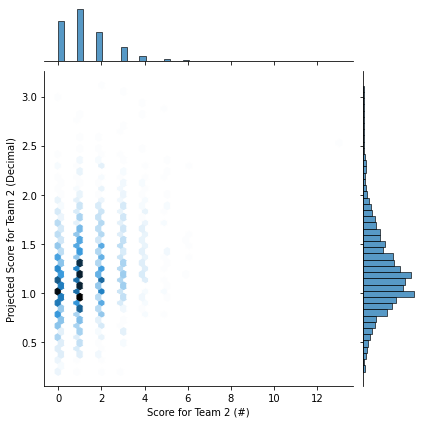

In [31]:
hexb1 =sns.jointplot(x=df['score2'],y=df['proj_score2'],kind="hex")
hexb1.set_axis_labels('x', 'y', fontsize=10)
hexb1.ax_joint.set_xlabel('Score for Team 2 (#)')
hexb1.ax_joint.set_ylabel('Projected Score for Team 2 (Decimal)')
plt.show()

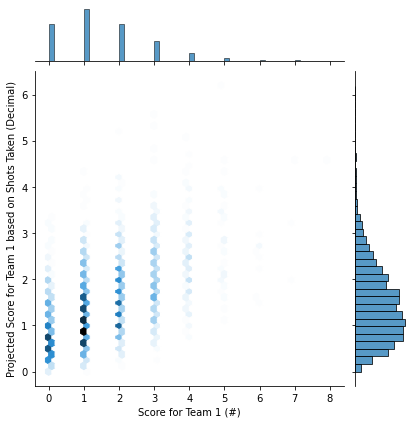

In [32]:
hexb2 =sns.jointplot(x=df['score1'],y=df['xg1'],kind="hex")
hexb2.set_axis_labels('x', 'y', fontsize=10)
hexb2.ax_joint.set_xlabel('Score for Team 1 (#)')
hexb2.ax_joint.set_ylabel('Projected Score for Team 1 based on Shots Taken (Decimal)')
plt.show()

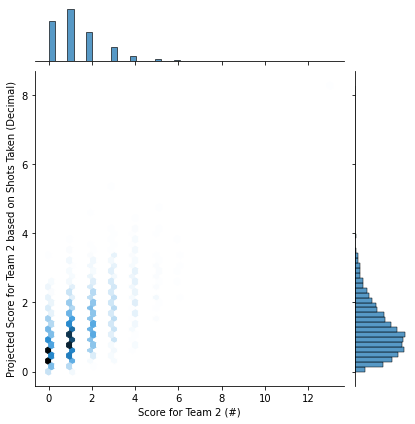

In [33]:
hexb3 =sns.jointplot(x=df['score2'],y=df['xg2'],kind="hex")
hexb3.set_axis_labels('x', 'y', fontsize=10)
hexb3.ax_joint.set_xlabel('Score for Team 2 (#)')
hexb3.ax_joint.set_ylabel('Projected Score for Team 2 based on Shots Taken (Decimal)')
plt.show()

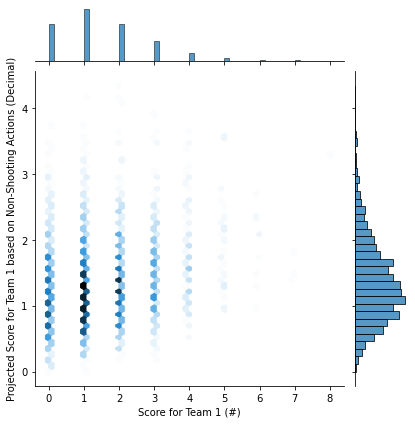

In [34]:
hexb4 =sns.jointplot(x=df['score1'],y=df['nsxg1'],kind="hex")
hexb4.set_axis_labels('x', 'y', fontsize=10)
hexb4.ax_joint.set_xlabel('Score for Team 1 (#)')
hexb4.ax_joint.set_ylabel('Projected Score for Team 1 based on Non-Shooting Actions (Decimal)')
plt.show()

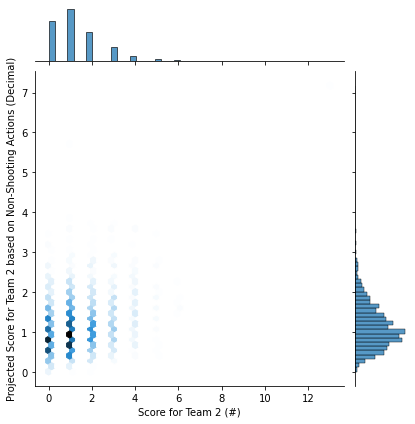

In [35]:
hexb5 =sns.jointplot(x=df['score2'],y=df['nsxg2'],kind="hex")
hexb5.set_axis_labels('x', 'y', fontsize=10)
hexb5.ax_joint.set_xlabel('Score for Team 2 (#)')
hexb5.ax_joint.set_ylabel('Projected Score for Team 2 based on Non-Shooting Actions (Decimal)')
plt.show()

<p> As can be seen in the hexbin plots all the parameters are heavily correlated and the majority fall around the same spot on the plot in between 0-2 goals. <p>

#### Creating Column if the prediction falls under the threshold +-0.5 (0 - prediction incorrect, 1 - prediction correct)

In [36]:
df['proj1Result'] = df.apply(project_functions.proj_1Pred, axis=1)
df['proj2Result'] = df.apply(project_functions.proj_2Pred, axis=1)
df['xg1Result'] = df.apply(project_functions.xg1, axis=1)
df['xg2Result'] = df.apply(project_functions.xg2, axis=1)
df['nsxg1Result'] = df.apply(project_functions.nsxg1, axis=1)
df['nsxg2Result'] = df.apply(project_functions.nsxg2, axis=1)

#### Countplots to plot the data
The countplot in this scenario will show us the prediction parameter and how often they predict the correct score. The higher number of times the predict correct the better is it. 

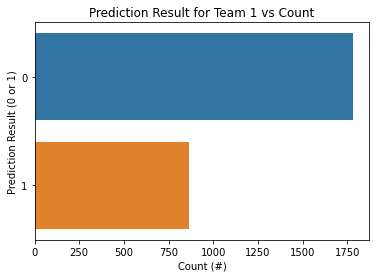

In [37]:
tab1 = sns.countplot(y="proj1Result", data=df)
tab1.set_title("Prediction Result for Team 1 vs Count")
tab1.set_xlabel("Count (#)")
tab1.set_ylabel("Prediction Result (0 or 1)")
plt.show()

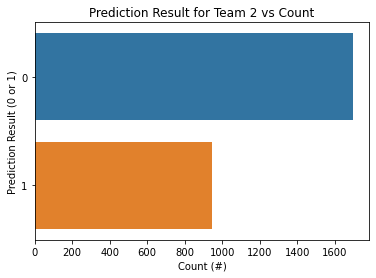

In [38]:
tab2 = sns.countplot(y="proj2Result", data=df)
tab2.set_title("Prediction Result for Team 2 vs Count")
tab2.set_xlabel("Count (#)")
tab2.set_ylabel("Prediction Result (0 or 1)")
plt.show()

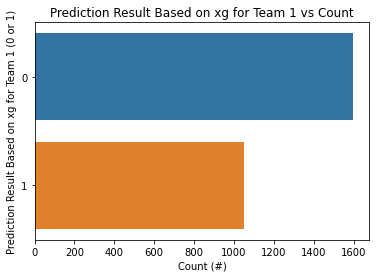

In [39]:
tab3 = sns.countplot(y="xg1Result", data=df)
tab3.set_title("Prediction Result Based on xg for Team 1 vs Count")
tab3.set_xlabel("Count (#)")
tab3.set_ylabel("Prediction Result Based on xg for Team 1 (0 or 1)")
plt.show()

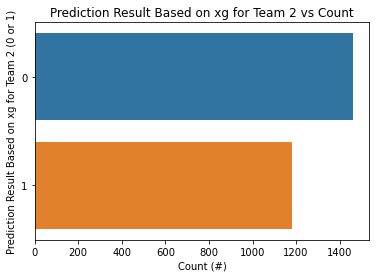

In [40]:
tab4 = sns.countplot(y="xg2Result", data=df)
tab4.set_title("Prediction Result Based on xg for Team 2 vs Count")
tab4.set_xlabel("Count (#)")
tab4.set_ylabel("Prediction Result Based on xg for Team 2 (0 or 1)")
plt.show()

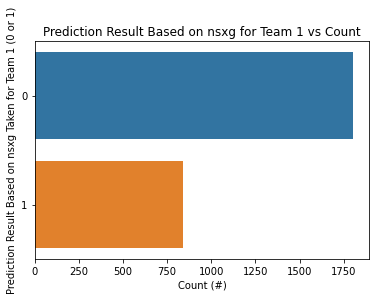

In [41]:
tab5 = sns.countplot(y="nsxg1Result", data=df)
tab5.set_title("Prediction Result Based on nsxg for Team 1 vs Count")
tab5.set_xlabel("Count (#)")
tab5.set_ylabel("Prediction Result Based on nsxg Taken for Team 1 (0 or 1)")
plt.show()

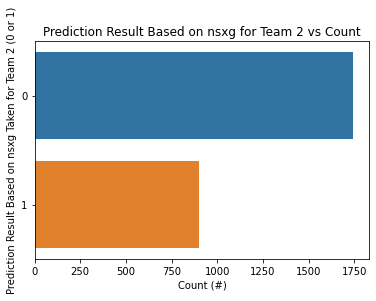

In [42]:
tab6 = sns.countplot(y="nsxg2Result", data=df)
tab6.set_title("Prediction Result Based on nsxg for Team 2 vs Count")
tab6.set_xlabel("Count (#)")
tab6.set_ylabel("Prediction Result Based on nsxg Taken for Team 2 (0 or 1)")
plt.show()

**Tables to illustrate Data**

<p> Table 3 - to show the number of times the correct score was predicted <p>

| | # of Correct | # of Incorrect | % of Correct |
| --- | --- | --- | --- |
| proj_score1 | 738        | 1354       | 32.7%  |
| proj_score2 | 807       | 1450      | 35.8% |
| xg1 | 903       | 1354     | 40.0% |
| xg2 | 1007       | 1250      | 44.6% |
| nsxg1 | 706       | 1551      | 31.3% |
| nsxg2 | 775       | 1482      | 34.3% |

#### Summary and Conclusion

- First, we observe the hexbin plots we made. By looking at the two projected scores plots (proj_score1, proj_score2), we can see there is a much more distributed plot as it looks as though projected scores are taking on more values. However, all of them seem to hover around 0-2 goals for the majority of the dataset. Next, by taking the threshold of +- 0.5 we can construct a new column to observe how good the predictions are. From this we construct our count plots to observe the single result variables as a whole. The countplots show the outlook of the data and we can get a easier to read view from our Table 3. The count plots show us that xg1/2 (shots) seem as though they have the best prediction of the actual scores with proj_score1/2 and nsxg1/2 (non-shot actions) close together. Table 3 gives us the percentage view of this and we can see it is clear that the shots metric (xg1/2) has the most correct predictions out of the bunch. To conclude, based on the data visualizations provided, the shots parameter (xg1/2) is the best at predicting the actual score. It is worth noting however that some of the data used to  formulate the shots (xg) and non-shooting action (nsxg) data was collected after the game and thus the estimation has some sort of data from the game in it, where as the projections for the scores (proj_score1/2) are based off of previous data and the SPI ranking, thus being harder to predict. Overall, none of the parameters seem to be very good as the highest percentage lies at 44.6%, but then again predicting the right score for a game is very hard and even having a 30-40% chance of being correct is still beneficial. 

# Conclusion

As a whole, the main question we had for this dataset was how good each factor (column) is at predicting the results of the match. The Exploratory Data Analysis (EDA) pointed us in the right direction. We took a deeper analysis into the variables and thus showing the dataset in different ways. The major profile report showed us how many missing variables we had as well as each variable in an in depth look. Furthermore, we constructed a correlation matrix, pairplots, hexbin plots, boxplot and strip plots, to observe relationships between variables. After conducting this EDA, we could take a better look at our main two research questions. The first research question relied on determining which of probability or importance was better at predicting the result of the match, and the other determining which of the predicted score parameters are better at prediciting the actual score of the match. From the first question after using our method of visualizations we were able to conclude that the probability parameter did a much better job than the importance parameter at predicting the actual score, however, neither were very efficient. Upon conducting method of visualizations on our second question we concluded that the xg parameter, an estimate of how many goals a team should have scored given the number of shots they took, was the best at predicting the correct score. As was the case with the first question, none of the parameters were very efficient. To conclude, we were able to confidently say which factor (column) were better at predicting the results of the matches. However, the prediction columns as a whole didn't exhibit high rates of success. This could be due to the wide array of outcomes in a soccer match or just the simple fact it is extremely difficult to predict anything in the real world. All together, it was a great experience conducting a full on analysis with a dataset I was interested in and using different methods to complete this.

## Processing data for my Tableau Dashboard

In [43]:
df.to_csv('../data/processed/data.csv', index=False)